In [1]:
from pathlib import Path
import numpy
from sklearn.feature_extraction.text import TfidfVectorizer
from pathlib import Path
import pandas as pd
import nltk
from collections import Counter
import pandas as pd
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string
import spacy
import re
import numpy as np
import spacy.cli
import plotly.graph_objects as go
import random
from wordfreq import zipf_frequency
from plotly.offline import plot
import networkx as nx
import matplotlib.pyplot as plt

In [2]:
### Set Up NLTK
nltk.download("punkt")
nltk.download('punkt_tab')
nltk.download("stopwords")
nltk.download("wordnet")
nltk.download("averaged_perceptron_tagger")
nltk.download('averaged_perceptron_tagger_eng')
stop_words  = set(stopwords.words("english"))
spacy.cli.download("en_core_web_lg")
nlp = spacy.load("en_core_web_lg")   # or 'lg' for slightly better coverage

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\gouth\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\gouth\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gouth\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\gouth\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\gouth\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\gouth\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_pe

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


### Load The Data

In [4]:
PATH_FOLDER = r"Downloads/Podcasts/Podcast Transcript/"
folder = Path(PATH_FOLDER)          

### Read Data
target_files = list(folder.rglob("*.txt")) + list(folder.rglob("*.srt"))
for file_path in target_files:
    try:
        content = file_path.read_text(encoding="utf-8", errors="ignore")
        # ---- do something with `content` here ----
        print(f"Read {file_path.name} ({len(content)} chars)")
    except Exception as e:
        print(f"⚠️  Skipped {file_path}: {e}")

### Read Files and Put Them Into Dataframe
records = []

for p in folder.rglob("*"):            # walks every sub-folder
    if p.suffix.lower() in {".txt", ".srt"}:
        try:
            text = p.read_text(encoding="utf-8", errors="ignore")
            records.append(
                {
                    "file_name": p.name,
                    "file_path": str(p),
                    "file_type": p.suffix.lstrip(".").lower(),
                    "content": text,
                }
            )
        except Exception as e:         # keeps loop alive if one file fails
            print(f"⚠️  Skipped {p}: {e}")

# ── 3. build the DataFrame ───────────────────────────────────────
df = pd.DataFrame(records)

# optional: quick peek
print(df.head())


Read Alex Podcast.transcript.vtt.txt (82838 chars)
Read Alex Podcast.txt (82838 chars)
Read Anais Sägesser Podcast Transcript.txt (43937 chars)
Read andrew (1).txt (57525 chars)
Read Antoinette Vermilye podcast Transcript.txt (58266 chars)
Read Carly Snedeker podcast Transcript.txt (65002 chars)
Read David podcast transcript.vtt.txt (89396 chars)
Read Ep 34 Monte Johnson Transcript.txt (43398 chars)
Read episdoe 77 daniel wildcat.txt (40668 chars)
Read Episode 35-Anthony Carnevale Podcast transcript.txt (35052 chars)
Read Episode 36 Anita Vangelisti Transcript.txt (33195 chars)
Read episode-1.txt (16694 chars)
Read episode-10.txt (37916 chars)
Read episode-11.txt (42172 chars)
Read episode-12.txt (39291 chars)
Read episode-13.txt (36875 chars)
Read episode-14.txt (37755 chars)
Read episode-15.txt (34591 chars)
Read episode-16.txt (44595 chars)
Read episode-17.txt (37944 chars)
Read episode-18.txt (34422 chars)
Read episode-19.txt (24082 chars)
Read episode-2.txt (17855 chars)
Read epis

### Clean Data

In [6]:
def clean_transcript(raw: str) -> str:
    text = raw
    # 1) Remove any line that contains a “-->” timestamp
    text = re.sub(r'(?m)^.*-->\s*.*\n?', '', text)
    # 2) Remove lines that are just numbers (e.g. “7”, “8”, etc.)
    text = re.sub(r'(?m)^\s*\d+\s*$\n?', '', text)
    # 3) Remove speaker labels at the start of a line (anything up to the first colon)
    text = re.sub(r'(?m)^[^:\n]+:\s*', '', text)
    # 4) Collapse multiple blank lines into just one
    text = re.sub(r'\n{2,}', '\n\n', text)
    return text.strip()

def preprocess(text: str):
    """Return a list of clean, lemmatized tokens."""
    # tokenize & lowercase
    tokens = nltk.word_tokenize(text.lower())
    # drop punctuation tokens & stop-words
    tokens = [
        w.translate(punct_table)               # strip punct
        for w in tokens
        if w.isalpha() and w not in stop_words # alphabetic & not a stop-word
    ]
    # lemmatize
    tagged = nltk.pos_tag(tokens)
    tokens = [w for w, tag in tagged if tag not in ("NNP", "NNPS")]
    tokens = [lemmatizer.lemmatize(w) for w in tokens]
    return tokens

In [7]:
# Remove beginning of conversation, including the intro song
df['content'] = [d[1000:] for d in df['content']]
df['content'] = [clean_transcript(d) for d in df['content']]

lemmatizer  = WordNetLemmatizer()
punct_table = str.maketrans("", "", string.punctuation)   # fast punctuation strip
df["tokens"] = df["content"].apply(preprocess)
all_tokens = [tok for tokens in df["tokens"] for tok in tokens]

df["clean_text"] = df["tokens"].apply(lambda toks: " ".join(toks))

### Preliminary Analysis

In [9]:
counter = Counter(all_tokens)

# 3. Build a DataFrame of (word, count) pairs, sorted descending
freq_df = (
    pd.DataFrame(counter.items(), columns=["word", "count"])
      .sort_values("count", ascending=False)
      .reset_index(drop=True)
)

# 4. Peek at your top 20
print("The 20 words that show up most")
print(freq_df.head(20))

The 20 words that show up most
         word  count
0        like  13218
1        know   8582
2       think   7938
3      people   5919
4      really   5302
5       thing   4970
6        kind   4046
7         one   3676
8       right   3440
9        mean   3368
10        way   3266
11        lot   2908
12  something   2890
13       yeah   2882
14      would   2728
15        get   2704
16        say   2531
17       time   2523
18       want   2489
19         go   2446


In [10]:
### Count Number of Time Each Token Appears In A Document
doc_freq = Counter()
for tokens in df["tokens"]:
    for tok in set(tokens):     # only count each token once per row
        doc_freq[tok] += 1

# 2. Keep only tokens with doc‐freq ≥ n
min_doc = 1
filtered = [(tok, freq) for tok, freq in doc_freq.items() if freq >= min_doc]

# 3. Build a DataFrame and sort
freq_df = (
    pd.DataFrame(filtered, columns=["word", "doc_freq"])
      .sort_values("doc_freq", ascending=False)
      .reset_index(drop=True)
)
freq_df.index = freq_df['word']

### Filter the Words

In [12]:
COMMON_ZIPF = 3.75
def is_thematic(word):
    doc = nlp(word)
    tok = doc[0]
    # must be a noun or proper-noun…
    if tok.pos_ not in ("NOUN", "PROPN"):
        return False
    # …and not too common in general English
    if zipf_frequency(word, "en") > COMMON_ZIPF:
        return False
        
    return True

def similarity_to(topic, tok):
    vec = nlp(tok).vector
    return float(np.dot(vec, topic) / (np.linalg.norm(vec) * np.linalg.norm(topic)))

In [13]:
edu_vec = nlp("education").vector
phil_vec = nlp("philosophy").vector
polit_vec = nlp("politics").vector
sci_vec = nlp("science").vector
tech_vec = nlp("technology").vector

In [14]:
# 2. Fit a TF-IDF model over all episodes
num_seasons = 8
vectorizer = TfidfVectorizer(
    max_df=1/num_seasons,      # ignore ultra-common terms
    min_df=1,        # only keep words in ≥2 docs
    stop_words="english"
)

X = vectorizer.fit_transform(df["clean_text"])

# 3. Compute each term’s mean TF-IDF score across the corpus
mean_tfidf = np.asarray(X.mean(axis=0)).ravel()
terms = np.array(vectorizer.get_feature_names_out())

# 4. Pick the top N “theme” words
top_n = 10000
top_idx = mean_tfidf.argsort()[::-1][:top_n]
theme_words = terms[top_idx]
words = theme_words
print(len(words))

# Run through first processing
thematic_only = [w for w in theme_words if is_thematic(w)]
print("Filtered thematic terms:", thematic_only)
print(len(thematic_only))

# Get similarity scores
ed = {tok: similarity_to(edu_vec, tok) for tok in thematic_only}
phil = {tok: similarity_to(phil_vec, tok) for tok in thematic_only}
politc = {tok: similarity_to(polit_vec, tok) for tok in thematic_only}
science = {tok: similarity_to(sci_vec, tok) for tok in thematic_only}
tech = {tok: similarity_to(tech_vec, tok) for tok in thematic_only}

# Run through second processing
threshold = [0.22, 0.3, 0.4, 0.4, 0.4]
selected = []
i = 0
for d in [ed, phil, politc, science, tech]:
    for tok, score in d.items():
        if score >= threshold[i]:
            selected.append(tok)
    i += 1

thematic_only = list(set(selected))
words = thematic_only
print(len(words))

10000
Filtered thematic terms: ['montessori', 'gpt', 'aikido', 'frisbee', 'adivasi', 'fremont', 'māori', 'modernity', 'decolonization', 'bangalore', 'calculus', 'intimacy', 'cortona', 'colonization', 'nook', 'mindfulness', 'aristotle', 'facilitator', 'colonialism', 'roi', 'preschool', 'grader', 'calculator', 'aliveness', 'heidegger', 'trait', 'metaphor', 'neuroscience', 'linkedin', 'anthropology', 'telescope', 'obstacle', 'himalaya', 'kilometer', 'hinduism', 'plato', 'existentialism', 'astrophysics', 'amygdala', 'jamal', 'fallacy', 'patriarchy', 'mccourt', 'nuke', 'adolescent', 'indictment', 'voucher', 'anishinaabe', 'descartes', 'nuance', 'stereotype', 'loneliness', 'abstraction', 'waldorf', 'sens', 'consultancy', 'nadu', 'tangent', 'stigma', 'utopia', 'pothole', 'airbnb', 'ngo', 'enlightenment', 'kansa', 'artifact', 'intuition', 'coursework', 'inequity', 'einstein', 'ucsd', 'similarity', 'krishnamurti', 'applicant', 'caste', 'sel', 'limitation', 'ancestry', 'traveler', 'burnout', 'co

C:\Users\gouth\AppData\Local\Temp\ipykernel_21312\3225999410.py:16: RuntimeWarning:

invalid value encountered in scalar divide



475


### Make the Graph

In [16]:
def get_pos(num, layout, network):
    print(num, layout)
    if layout:
        pos = nx.fruchterman_reingold_layout(network, weight = 'n', iterations=50, seed=num, k = 0.005)
    else:
        #pos = nx.kamada_kawai_layout(network, weight = 'n')
        pos = nx.spring_layout(network, weight = 'n', k = 0.02, seed = num)  # Define the node positions
    
    # 2) Convert to array for distance calculations
    nodes = list(pos.keys())
    coords = np.array([pos[n] for n in nodes])

    # 3) Compute centroid and distances
    center = coords.mean(axis=0)
    dists = np.linalg.norm(coords - center, axis=1)

    outlier_percentile = 75
    # 4) Determine threshold distance at given percentile
    threshold = np.percentile(dists, outlier_percentile)

    # 5) Identify and pull in outliers
    outlier_mask = dists > threshold
    if np.any(outlier_mask):
        # Unit vectors from center for outliers
        unit_dirs = (coords[outlier_mask] - center) / dists[outlier_mask, None]
        # Project back to boundary
        coords[outlier_mask] = center + unit_dirs * threshold

        # 6) Update pos dict with adjusted coordinates
        for idx, node in enumerate(nodes):
            pos[node] = coords[idx]

    return pos

In [17]:
# ── 1. Build co-occurrence counts ─────────────────────────────────
cooc = Counter()
theme_words = words
print(len(theme_words))
for tokens in df["tokens"]:

    # keep only the thematic words present in this doc
    present = set(tokens).intersection(theme_words)
    # count each unordered pair once
    for w1 in present:
        for w2 in present:
            if w1 < w2:
                cooc[(w1, w2)] += 1

# ── 2. Create the graph ─────────────────────────────────────────────
G = nx.Graph()
G.add_nodes_from(theme_words)

# add an edge only if the pair co-occurred at least twice (tune as needed)
min_cooc = 1
for (w1, w2), wt in cooc.items():
    if wt >= min_cooc:
        G.add_edge(w1, w2, weight=wt)


print(len(G.edges())/len(G.nodes()))

475
22.98315789473684


In [18]:
### Get Hover Content

in_ep = {}
for wd in G.nodes():
    ep = []
    for i in range(len(df)):
        if wd in df.iloc[i]['tokens']:
            ep.append(str(i+1))
    in_ep[wd] = ep

hover_texts = []
for w in G.nodes():
    eps = in_ep.get(w, [])
    # join with <br> so Plotly shows one per line
    hover_texts.append(
        f"<b>{w}</b><br>"
        f"<sub>episodes: {', '.join(eps)}</sub>"
    )

In [24]:
def draw_plot(network, pos, scaled_values, sizes, names, node_colors):
    # EDGES
    edge_x = []
    edge_y = []
    edges_list = []
    i = 0
    keys = pos.keys()

    for edge in network.edges():
        
        if edge[0] not in keys or edge[1] not in keys:
            continue

        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)

        edges_list.append(dict(type='scatter', 
                          x = [x0, x1],
                          y = [y0, y1],
                          mode = 'lines',
                          line = dict(width = scaled_values[i], color = 'black')))
        i += 1

    
    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.01, color='black'),
        hoverinfo='none',
        mode='lines')
    
    # 2) build one trace per unique width
    node_x = []
    node_y = []
    
    for node in network.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)

    # 2) Compute each node’s radial distance from the centroid
    coords = np.vstack((node_x, node_y)).T
    center = coords.mean(axis=0)            # use the average (x,y) as “center”
    dists = np.linalg.norm(coords - center, axis=1)
    # normalize to [0,1]
    dists_norm = (dists - dists.min()) / (dists.max() - dists.min())
    
    # 3) Define a custom pastel-blue colorscale
    pastel_ocean = [
    [0.00, '#2E6C98'],  # deepest pastel‐blue at the very center
    [0.02, '#5E9ECF'],  # inner pastel
    [0.07, '#80B9DD'],  # mid‐tone pastel
    [0.25, '#B6DBF2'],  # light pastel
    [0.60, '#A3CFF1'],  # ← new extra stop halfway out
    [1.00, '#B1D4F7'],  # more pronounced pastel‐blue at the outside
    ]

    gamma = 2.5   # try values between 1.5 and 3.0
    dists_norm = dists_norm ** gamma

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers',
        hoverinfo='text',
        text=hover_texts,
        textposition='middle center',  # Set the position of the text within the nodes
        marker=dict(
            showscale=False,
            # colorscale options
            #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
            #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
            #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
            color=dists_norm,
            colorscale=pastel_ocean,
            size=sizes, 
            opacity = 1,
            line_color = 'black',# Increase the size of the nodes
            line_width=.2))


    # Create annotation trace for node labels
    annotation_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='text',
        #text=txts,  # Set the labels as the text to display inside the nodes
        textposition='middle center',  # Position the text at the center of each node
        textfont=dict(size=12, color='black')  # Customize the font size and color of the text
    )

    # Add this back after
    
    #dta =  edge_trace + [node_trace]
    # [edge_trace, node_trace]
    fig = go.Figure([edge_trace, node_trace],
                    layout=go.Layout(
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0,l=0,r=0,t=0),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                    )

    
    # Set the figure size
    fig.update_layout(
        width=1200,  # Specify the width of the figure in pixels
        height=500,
        margin=dict(l=0, r=0, b=0, t = 0),
    # Specify the height of the figure in pixels
    )

    fig.update_layout(template='plotly_white')
    fig.show(config={'displayModeBar': False})
    return fig

def rescale(x, minval=None, maxval=None, newmin, newmax):
    return newmin + (x - minval) / (maxval - minval) * (newmax - newmin)
#f = draw_plot(G, pos, [cooc[e]**.6 for e in G.edges()], sizes, list(G.nodes), node_colors)

439
439 False


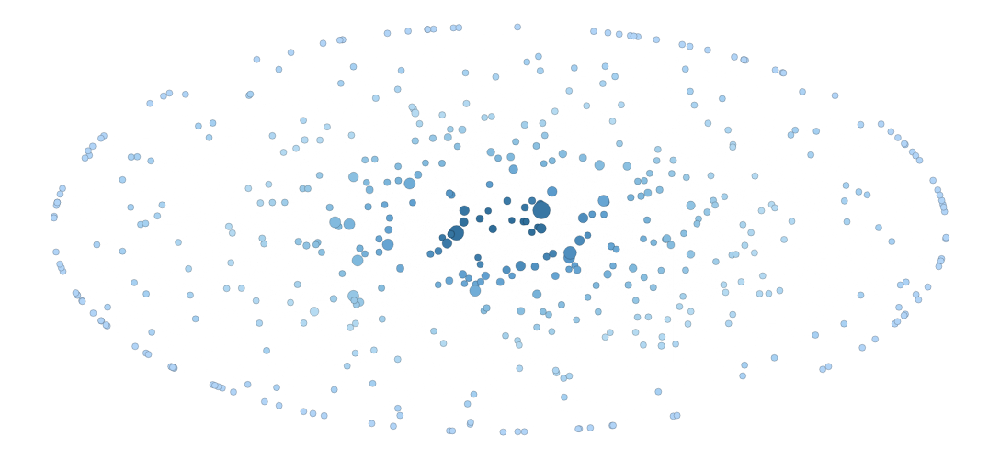

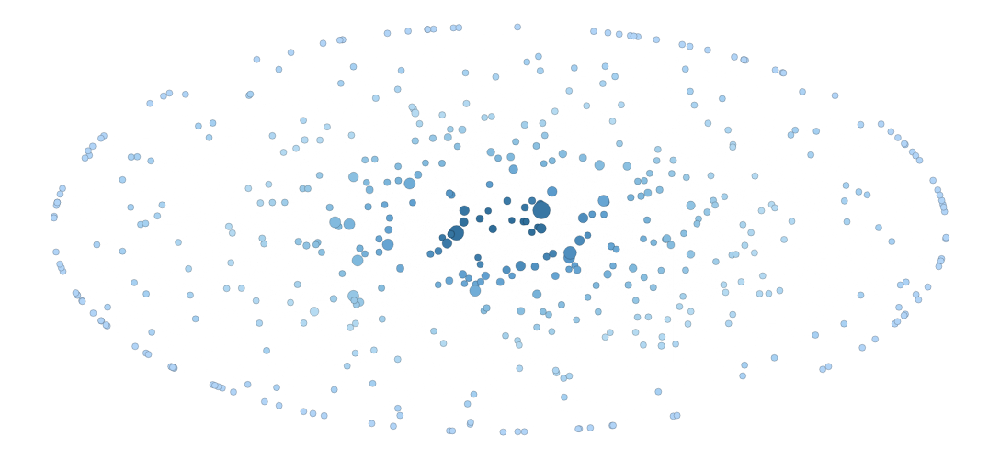

207
207 False


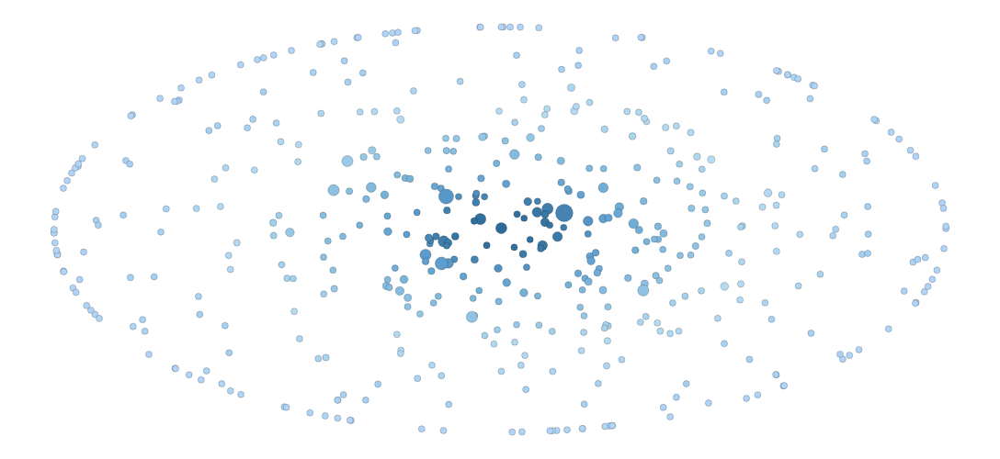

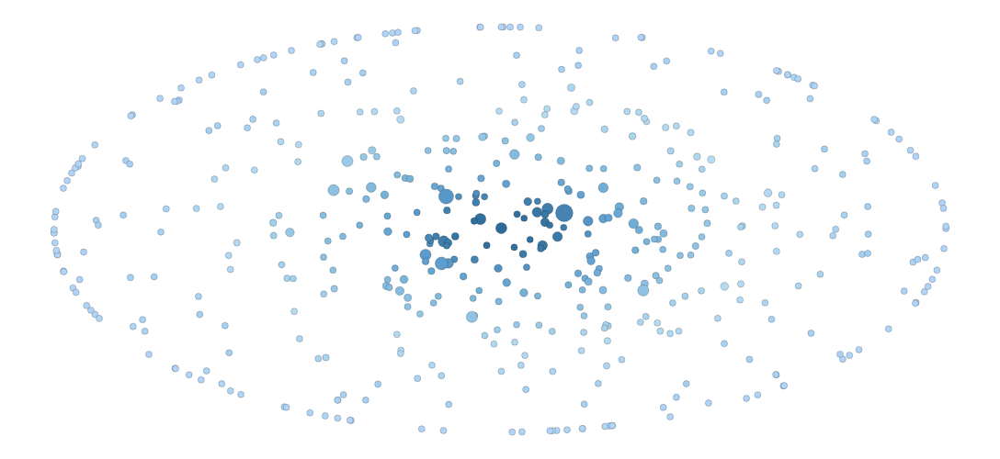

In [32]:
### Test Different Layouts

for i in range(2):
    n = random.randint(1, 500)
    print(n)
    
    pos = get_pos(n, False, G)
    #pos = new_positions(pos)
    f= [(f**3.5) for f in freq_df.loc[list(G.nodes())]['doc_freq'].values]
    ma = max(f)
    mi = min(f)
    sizes = [rescale(m, mi, ma, 7, 19) for m in f]
    
    f = draw_plot(G, pos, [cooc[e]**.6 for e in G.edges()], sizes, list(G.nodes), ['black'] * len(G.nodes()))
    f.show()

### Choose Graph and Save as HTML

In [ ]:
pos = get_pos(479, True, G)
#pos = new_positions(pos)
f= [(f**3.5) for f in freq_df.loc[list(G.nodes())]['doc_freq'].values]
ma = max(f)
mi = min(f)
sizes = [rescale(m, mi, ma, 7, 19) for m in f]
f = draw_plot(G, pos, [cooc[e]**.6 for e in G.edges()], sizes, list(G.nodes), ['black'] * len(G.nodes()))
plot(f, filename='my_plot.html', auto_open=True)

In [ ]:
'''
CODE TO GROUP USING THE TFIDF MATRIX
from sklearn.decomposition import NMF

# Use the same TF-IDF matrix X
n_topics = 26
model = NMF(n_components=n_topics, random_state=0)
W = model.fit_transform(X)    # document-topic
H = model.components_         # topic-term

words = []
comms = []

# find a number to set the groups
n = 50
for i, topic in enumerate(H):
    top_terms = terms[topic.argsort()[::-1][:n]]
    print(topic.argsort()[::-1][:150].sum())
    

    print(f"Topic {i+1}:", ", ".join(top_terms))
    words += list(top_terms)
    print(len(top_terms))
    comms.append(list(top_terms))
'''